In [1]:
import pickle
import pandas as pd
import numpy as np
import cv2 as cv
import math
import random
from sklearn.linear_model import LinearRegression
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (20, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 20
plt.rcParams["axes.grid"] =True

# Map

In [81]:
class Map:
    
    color_map = None
    policy = None
    pos_to_coord = None
    coord_to_pos = None
    
    def __init__(self, path_to_map, path_to_policy=None, calib_coord=None, calib_bmp=None):
        self.color_map = cv.imread(path_to_map)
        self.color_map = cv.cvtColor(self.color_map, cv.COLOR_BGR2RGB)
        if path_to_policy is None:
            self.policy = np.ones(shape=self.map.shape())*255
        else:
            self.policy = cv.imread(path_to_policy,cv.IMREAD_GRAYSCALE)
        if calib_coord is not None and calib_bmp is not None:
            self.calibrate(calib_coord, calib_bmp)
        pass
    
    
    def calibrate(self, calib_coord, calib_bmp):
        self.coord_to_pos = LinearRegression()
        self.coord_to_pos.fit(calib_coord,calib_bmp)
        self.pos_to_coord = LinearRegression()
        self.pos_to_coord.fit(calib_bmp,calib_coord)
    
    
    def to_coord(self, bmp_pos):
        if self.pos_to_coord is not None:
            return self.pos_to_coord.predict(bmp_pos)
        else:
            return None
    
    
    def to_pos(self, coord):
        if self.coord_to_pos is not None:
            return np.round(self.coord_to_pos.predict(coord)).astype(int)
        else:
            return None
    
    def plot(self, coord=None, file=None):
        plot_map = self.get_plot(coord)
        if file is not None:
            cv.imwrite(file, cv.cvtColor(plot_map, cv.COLOR_RGB2BGR))
        else:
            fig = plt.figure(figsize=(40,20))
            plt.grid(False)
            plt.imshow(plot_map)
            plt.show()

    def get_plot(self, coord=None):
        plot_map = self.color_map.copy()
        if coord is not None:
            pos = self.to_pos(coord)
            if pos is not None:
                for point in pos:
                    cv.circle(plot_map, (point[1], point[0]), radius=1, color=(255,0,0), thickness=-1)
        return plot_map
    
    def plot_policy(self):
        plt.figure(figsize=(40,20))
        plt.grid(False)
        plt.imshow(self.policy)
        plt.show()
        
    def get_shape(self):
        return self.policy.shape[0:2]
    
    def get_policy_prob_pos (self,pos):
        prob = np.zeros(len(pos))
        for i,point in enumerate(pos):
            if ((point[0]<0) or (point[0]>=self.policy.shape[0]) or (point[1]<0) or (point[1]>=self.policy.shape[1])):
                prob[i] = self.policy[0,0] * 0
            else:
                prob[i] = self.policy[point[0],point[1]] / 255
        return prob
    
    def get_policy_prob (self,coords):
        points = self.to_pos(coords)
        prob = np.zeros(points.shape[0])
        for i,point in enumerate(points):
            if ((point[0]<0) or (point[0]>=self.policy.shape[0]) or (point[1]<0) or (point[1]>=self.policy.shape[1])):
                prob[i] = self.policy[0,0] * 0
            else:
                prob[i] = self.policy[point[0],point[1]] / 255
        
        return prob
    
    @staticmethod
    def destinationPoint(lat, lon, distance, bearing):
        '''
        Returns the destination point from a given point, having travelled the given distance
        on the given initial bearing.

        @param   {number} lat - initial latitude in decimal degrees (eg. 50.123)
        @param   {number} lon - initial longitude in decimal degrees (e.g. -4.321)
        @param   {number} distance - Distance travelled (metres).
        @param   {number} bearing - Initial bearing (in degrees from north).
        @returns {array} destination point as [latitude,longitude] (e.g. [50.123, -4.321])

        @example
        var p = destinationPoint(51.4778, -0.0015, 7794, 300.7); // 51.5135°N, 000.0983°W
        '''
        radius = 6371e3; # (Mean) radius of earth
        
        def toRadians(v):
            return v * math.pi / 180
        
        def toDegrees(v):
            return v * 180 / math.pi


        delta = distance / radius; # angular distance in radians
        theta = toRadians(bearing);

        phi_1 = toRadians(lat);
        lambda_1 = toRadians(lon);
        
        sin_phi_1 = math.sin(phi_1) 
        cos_phi_1 = math.cos(phi_1)
        sin_delta = math.sin(delta)
        cos_delta = math.cos(delta)
        sin_theta = math.sin(theta)
        cos_theta = math.cos(theta)

        sin_phi_2 = sin_phi_1* cos_delta + cos_phi_1 * sin_delta * cos_theta
        phi_2 = math.asin(sin_phi_2)
        y = sin_theta * sin_delta * cos_phi_1
        x = cos_delta - sin_phi_1 * sin_phi_2
        lambda_2 = lambda_1 + math.atan2(y, x)
        
        lat2 = toDegrees(phi_2)
        
        lon2 = (toDegrees(lambda_2) + 540) % 360 - 180 # normalise to −180..+180°

        return lat2,lon2
    
    @staticmethod
    def haversine(lon1, lat1, lon2, lat2):
        """
        Calculate the great circle distance in meters between two points 
        on the earth (specified in decimal degrees)
        """
        # convert decimal degrees to radians 
        lon1 = math.radians (lon1)
        lat1 = math.radians (lat1)
        lon2 =  math.radians (lon2)
        lat2 =  math.radians (lat2)

        # haversine formula 
        dlon = lon2 - lon1 
        dlat = lat2 - lat1 
        a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
        c = 2 * math.asin(math.sqrt(a)) 
        r = 6371 * 1000 # Radius of earth in meters.
        return c * r 
    
    @staticmethod
    def get_bearing(lat1, long1, lat2, long2):
        dLon = (long2 - long1)
        x = math.cos(math.radians(lat2)) * math.sin(math.radians(dLon))
        y = math.cos(math.radians(lat1)) * math.sin(math.radians(lat2)) - math.sin(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.cos(math.radians(dLon))
        brng = np.arctan2(x,y)
        brng = np.degrees(brng)

        return brng

In [82]:
rosario_map_path = 'map/raw.png'
rosario_policy_path = 'map/Rosario_compress_blur.bmp'
calib_coord = [[ -32.95907 , -60.63112],[ -32.9486 , -60.71226],[ -32.87341 , -60.69889],[ -32.92526 , -60.66143]]
calib_bmp = [[ 1370 , 1258],[ 1212 , 215],[ 56, 386],[ 853, 867]]

work_map = Map(rosario_map_path,rosario_policy_path, calib_coord, calib_bmp)

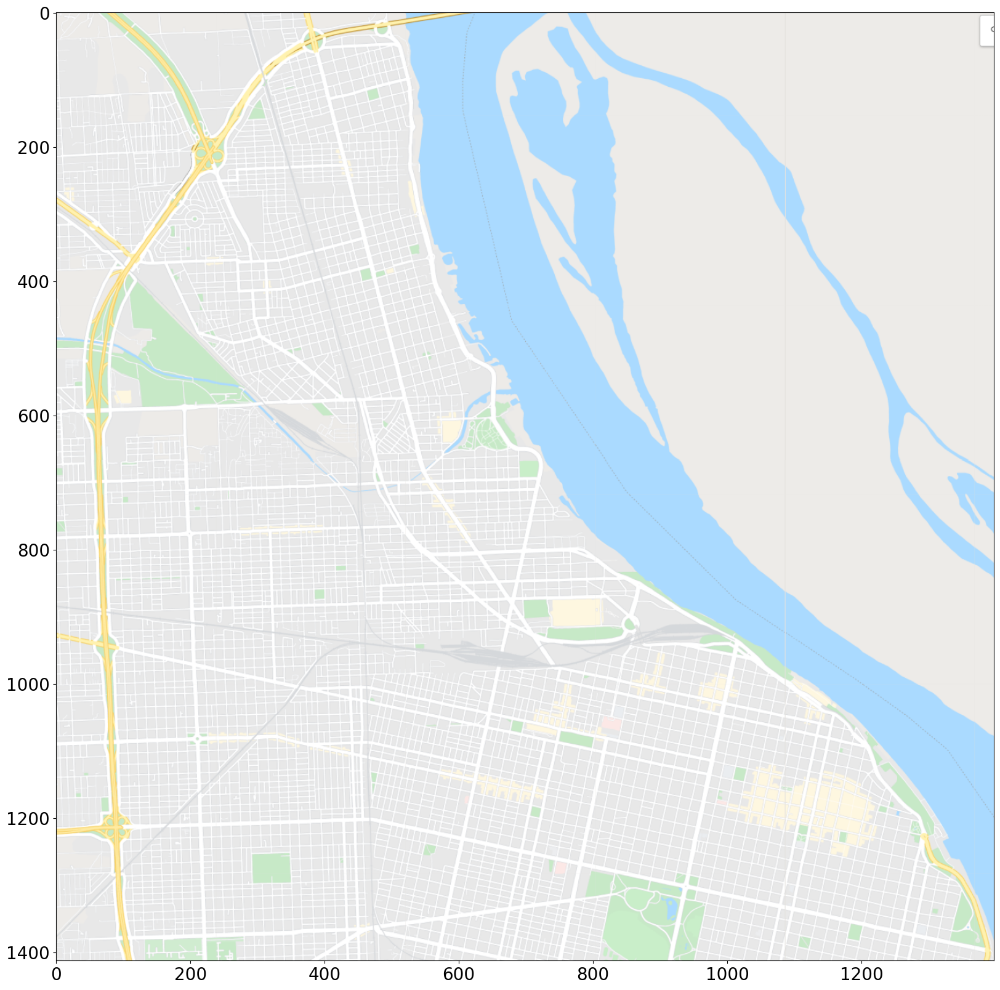

In [83]:
work_map.plot()

# Path Data

In [84]:
route_path = "data/SensorTracker.csv"
route = pd.read_csv(route_path, sep=",")

In [85]:
route.head()

,Unnamed: 0,Timestamp,Accel_x,Accel_y,Accel_z,Gyro_x,Gyro_y,Gyro_z,Light,Magnetic_x,Magnetic_y,Magnetic_z,Proximity,Latitude,Longitude,Elevation,Speed,Acceleration,Bearing
0,0,1.633986e+09,-0.348,-1.021,9.815,-0.003,-0.013,0.004,410.5,-47.831,18.263,-58.669,5.0,-32.95812,-60.63654,52.8,8.083333,-1.021,86.323690
1,1,1.633986e+09,0.049,-0.755,10.256,-0.005,0.028,-0.001,410.5,-48.469,15.900,-60.525,5.0,-32.95813,-60.63644,53.6,8.361111,-0.755,61.604633
2,2,1.633986e+09,-0.499,-1.013,9.925,-0.023,-0.014,-0.005,410.5,-48.975,18.281,-59.419,5.0,-32.95815,-60.63635,51.9,8.361111,-1.013,30.706606
3,3,1.633986e+09,-0.447,-0.975,10.309,-0.008,-0.013,0.019,372.5,-48.788,16.856,-58.800,5.0,-32.95816,-60.63627,51.2,8.111111,-0.975,82.547460
4,4,1.633986e+09,-0.504,-0.999,9.621,-0.008,-0.003,0.012,372.5,-50.456,19.406,-60.488,5.0,-32.95818,-60.63618,50.6,7.750000,-0.999,88.920540


# Particle

In [86]:
class Particle():
    
    def __init__(self, init_pos, speed, bearing):
        self.pos = init_pos
        self.pos_history = [init_pos]
        self.fitness_history = []
        self.speed = speed
        self.bearing = bearing
        self.last_distance = 0.0
        self.last_speed = 0.0
        self.last_bearing = 0.0
        self.cum_distance = 0.0
        self.c1 = 0.1
        self.c2 = 0.1

    def move(self, timestep=1):
        if self.speed is not None and len(self.speed)>0 and self.bearing is not None and len(self.bearing)>0:
            self.last_speed = self.speed.pop(0)
            self.last_bearing = self.bearing.pop(0)
            self.last_distance = self.last_speed  * timestep
            self.cum_distance = self.cum_distance + self.last_distance
            self.pos = Map.destinationPoint(self.pos[0], self.pos[1], self.last_distance, self.last_bearing)

    def save_pos(self):
        self.pos_history.append(self.pos)
        self.fitness_history.append(work_map.get_policy_prob([self.pos])[0])

    def is_finished(self):
        return self.speed is None or len(self.speed) == 0 or self.bearing is None or len(self.bearing) == 0

    def reset_cumulative_distance(self):
        self.cum_distance = 0.0

    def get_cumulative_distance(self):
        return self.cum_distance

    def pso_start(self):
        self.best_pso_fitness = -1
        self.pso_evaluate()
        self.last_speed = 0
        self.last_bearing = 0

    def pso_evaluate(self):
        self.last_pso_fitness = work_map.get_policy_prob([self.pos])[0]
        if self.last_pso_fitness > self.best_pso_fitness:
            self.best_pso_fitness = self.last_pso_fitness
            self.pbest = self.pos

    def pso_move(self, gbest_pos, gbest_fitness, timestep = 1):
        lbest = None
        new_pos = self.pos
        if self.last_speed > 0:
            distance = self.last_speed * timestep
            new_pos = Map.destinationPoint(self.pos[0], self.pos[1], distance, self.last_bearing)
        if self.pbest != self.pos:
            pbest_distance = Map.haversine(new_pos[0], new_pos[1], self.pbest[0], self.pbest[1])
            pbest_bearing = Map.get_bearing(new_pos[0], new_pos[1], self.pbest[0], self.pbest[1])
            new_pos = Map.destinationPoint(new_pos[0], new_pos[1], self.c1 * pbest_distance, pbest_bearing)
        if gbest_pos is not None and gbest_pos != self.pos and gbest_fitness > self.best_pso_fitness:
            gbest_distance = Map.haversine(new_pos[0], new_pos[1], gbest_pos[0], gbest_pos[1])
            gbest_bearing = Map.get_bearing(new_pos[0], new_pos[1], gbest_pos[0], gbest_pos[1])
            new_pos = Map.destinationPoint(new_pos[0], new_pos[1], self.c2 * gbest_distance, gbest_bearing)
        if new_pos != self.pos:
            self.last_speed = Map.haversine(self.pos[0], self.pos[1], new_pos[0], new_pos[1])
            self.last_bearing = Map.get_bearing(self.pos[0], self.pos[1], new_pos[0], new_pos[1])
            self.pos = new_pos

    def pso_set_pbest(self):
        self.pos = self.pbest

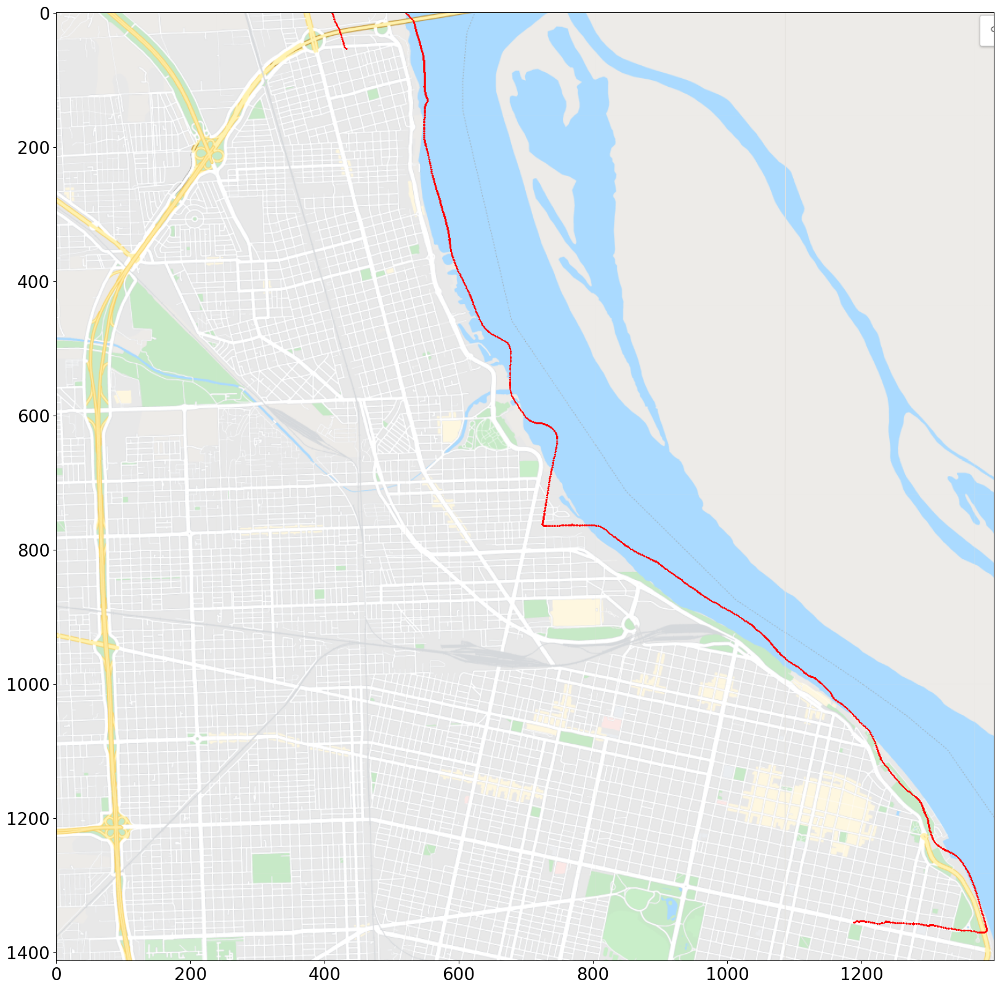

In [87]:
particle = Particle((route['Latitude'].iloc[0], route['Longitude'].iloc[0]), list(route['Speed']), list(route['Bearing']))

while not particle.is_finished():
    particle.move()
    particle.save_pos()

work_map.plot(particle.pos_history)

# Evolución con partículas y ruido superpuesto

Creando muchas partículas, y asignandole a cada una una copia de las series de tiempo de velocidad y ángulo de movimiento con ruido reducido superpuesto, podemos obtener la partícula con movimientos que respetan la serie de tiempo original y se ajustan lo mejor posible a posiciones válidas

In [100]:
max_particles = 500
min_distance_update = 50

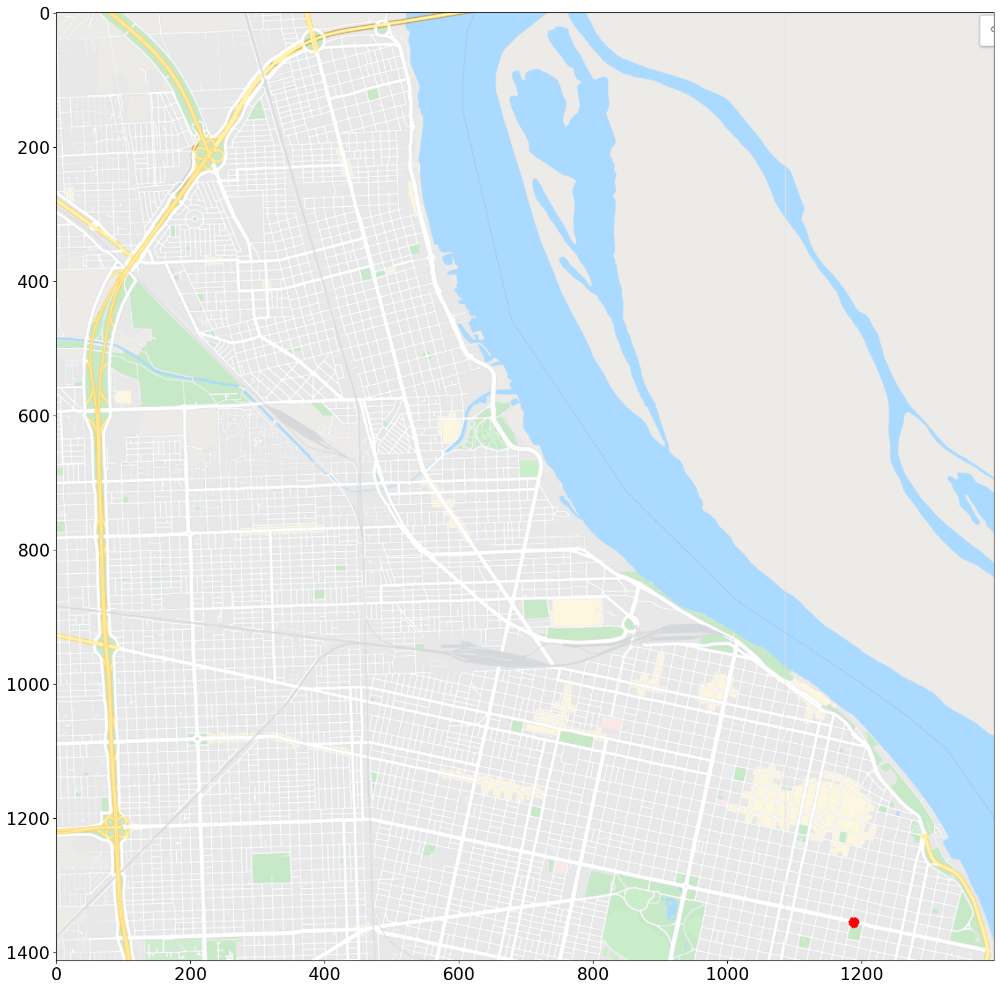

In [101]:
points_initial_coord = []
coord_0 = (route['Latitude'].iloc[0], route['Longitude'].iloc[0])
coord_0_noise_distance = np.random.uniform(0, 50, size=max_particles)
coord_0_noise_bearing = np.random.uniform(-180, 180, size=max_particles)

for i in range(max_particles):
    points_initial_coord.append(Map.destinationPoint(coord_0[0], coord_0[1], coord_0_noise_distance[i], coord_0_noise_bearing[i]))

np.random.shuffle(points_initial_coord)
work_map.plot(points_initial_coord)

In [187]:
population = []
speed = np.array(route['Speed'])
speed = speed[0:len(speed)]
bearing = np.array(route['Bearing'])
bearing = bearing[0:len(bearing)]

for init_coord in points_initial_coord:
    normal_noise_speed = speed + 0.5 * abs(speed) * np.random.normal(0,1,len(speed))
    normal_noise_bearing = bearing +  5 * np.random.normal(0, 1,len(bearing))
    particle = Particle(init_coord, list(normal_noise_speed), list(normal_noise_bearing))
    population.append(particle)

In [188]:
class Video:

    def __init__(self, filename, shape, fps=60):
        fourcc = cv.VideoWriter_fourcc(*"mp4v")
        self.video = cv.VideoWriter(filename, fourcc, fps, (shape[1],shape[0]))

    def snapshot(self, image):
        self.video.write(cv.cvtColor(image, cv.COLOR_RGB2BGR))

    def stop(self):
        self.video.release()

In [189]:
movement = 0
total_movements = len(speed)
epoch = 1
all_particles_fitness_history = []
max_particle_fitness_history = []

evolution_video = Video("results/evolution.mp4", work_map.get_shape())

while movement < total_movements:
    # Particles evolution
    for particle in population:
        particle.reset_cumulative_distance()
    while movement < total_movements and population[0].get_cumulative_distance() < min_distance_update:
        for particle in population:
            particle.move()
        movement = movement + 1
        evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))

    # Save position
    for particle in population:
        particle.save_pos()

    # Calculate metrics
    max_particle_fitness = max([sum(particle.fitness_history) for particle in population])
    max_particle_fitness_history.append(max_particle_fitness)
    all_particles_fitness = sum([sum(particle.fitness_history) for particle in population])
    all_particles_fitness_history.append(all_particles_fitness)

    # Print results
    print(f"Epoch:{epoch} | All Particles Fitness (Cumulative/Avg) = {all_particles_fitness:.2f} / {(all_particles_fitness/epoch):.2f}"\
        f" | Max Particle Fitness (Cumulative/Avg) = {max_particle_fitness:.2f} / {(max_particle_fitness/epoch):.2f}")
    epoch = epoch + 1
    
evolution_video.stop()

Epoch:1 | All Particles Fitness (Cumulative/Avg) = 420.07 / 420.07 | Max Particle Fitness (Cumulative/Avg) = 1.00 / 1.00
Epoch:2 | All Particles Fitness (Cumulative/Avg) = 832.54 / 416.27 | Max Particle Fitness (Cumulative/Avg) = 2.00 / 1.00
Epoch:3 | All Particles Fitness (Cumulative/Avg) = 1214.56 / 404.85 | Max Particle Fitness (Cumulative/Avg) = 3.00 / 1.00
Epoch:4 | All Particles Fitness (Cumulative/Avg) = 1507.40 / 376.85 | Max Particle Fitness (Cumulative/Avg) = 4.00 / 1.00
Epoch:5 | All Particles Fitness (Cumulative/Avg) = 1863.68 / 372.74 | Max Particle Fitness (Cumulative/Avg) = 5.00 / 1.00
Epoch:6 | All Particles Fitness (Cumulative/Avg) = 2019.46 / 336.58 | Max Particle Fitness (Cumulative/Avg) = 6.00 / 1.00
Epoch:7 | All Particles Fitness (Cumulative/Avg) = 2207.77 / 315.40 | Max Particle Fitness (Cumulative/Avg) = 7.00 / 1.00
Epoch:8 | All Particles Fitness (Cumulative/Avg) = 2431.64 / 303.95 | Max Particle Fitness (Cumulative/Avg) = 8.00 / 1.00
Epoch:9 | All Particles Fi

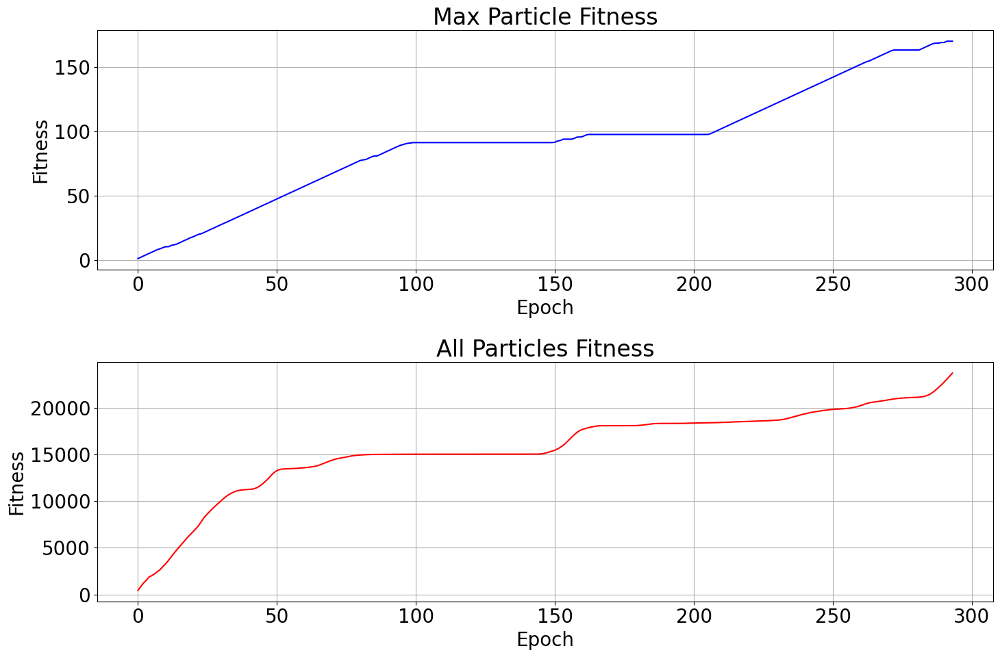

In [190]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1.plot(max_particle_fitness_history, color='blue')
ax1.set_title('Max Particle Fitness')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Fitness')

ax2.plot(all_particles_fitness_history, color='red')
ax2.set_title('All Particles Fitness')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Fitness')

plt.tight_layout()
plt.show()

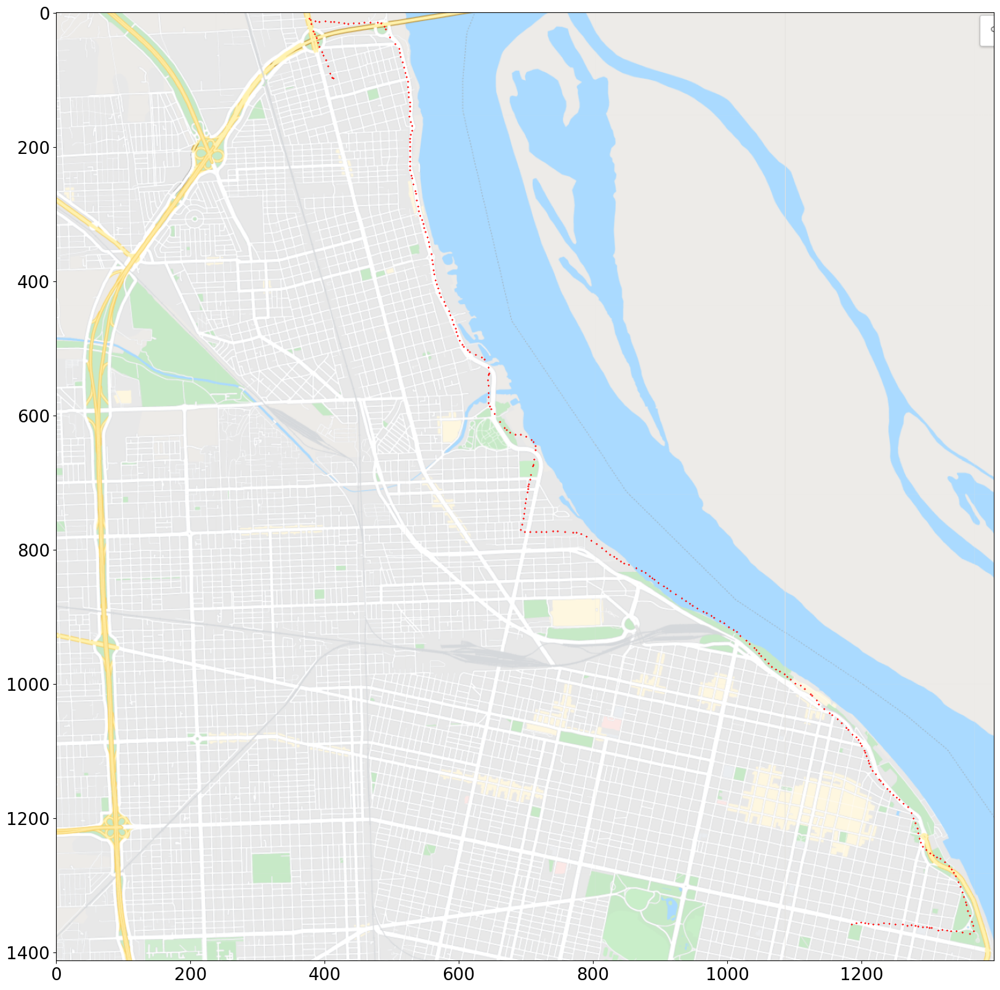

In [192]:
best_particle=np.argsort([sum(particle.fitness_history) for particle in population])[-1]
work_map.plot(population[best_particle].pos_history)

# Evolución con PSO

Al caso anterior podemos agregar cada cierto número de evoluciones (por ejempo cada 50 metros de movimiento) una instancia de n cantidad de épocas de PSO para que cada partícula se ajuste a la mejor posición encontrada por si misma y por la mejor partícula hasta el momento. Esto debería mejorar el ajuste y lograr un fitness promedio y máximo superior al caso anterior, mientras que respeta la serie de tiempo de velocidad y ángulo de movimiento original.

# Configuration

In [194]:
max_particles = 500
min_distance_update = 50
pso_epochs = 30

# Initialization

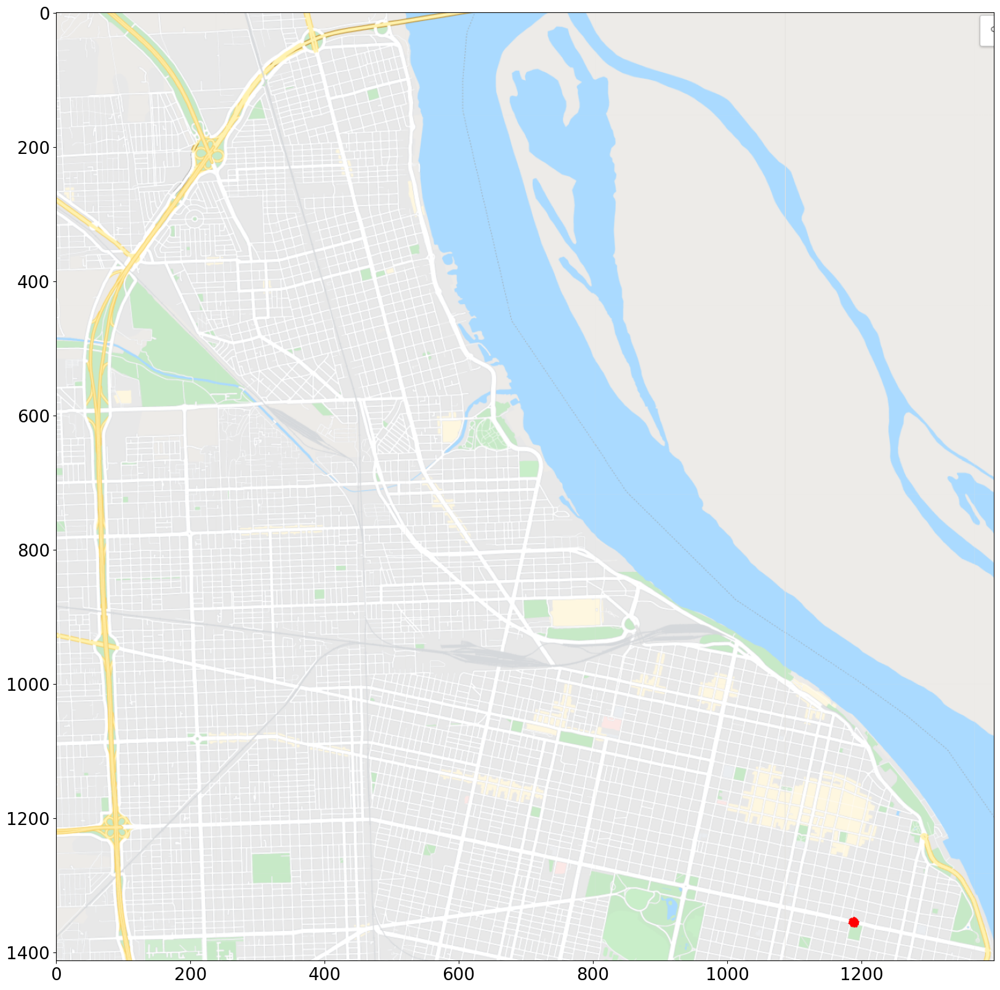

In [195]:
points_initial_coord = []
coord_0 = (route['Latitude'].iloc[0], route['Longitude'].iloc[0])
coord_0_noise_distance = np.random.uniform(0, 50, size=max_particles)
coord_0_noise_bearing = np.random.uniform(-180, 180, size=max_particles)

for i in range(max_particles):
    points_initial_coord.append(Map.destinationPoint(coord_0[0], coord_0[1], coord_0_noise_distance[i], coord_0_noise_bearing[i]))

np.random.shuffle(points_initial_coord)
work_map.plot(points_initial_coord)

In [201]:
population = []
speed = np.array(route['Speed'])
speed = speed[0:len(speed)]
bearing = np.array(route['Bearing'])
bearing = bearing[0:len(bearing)]

for init_coord in points_initial_coord:
    normal_noise_speed = speed + 0.5 * abs(speed) * np.random.normal(0,1,len(speed))
    normal_noise_bearing = bearing +  5 * np.random.normal(0, 1,len(bearing))
    particle = Particle(init_coord, list(normal_noise_speed), list(normal_noise_bearing))
    population.append(particle)

# Evolutive Algorithm

In [202]:
movement = 0
total_movements = len(speed)
epoch = 1
total_pso_fitness = []
all_particles_fitness_history = []
max_particle_fitness_history = []


evolution_video = Video("results/pso.mp4", work_map.get_shape())

while movement < total_movements:
    # Step 1 particle movement
    for particle in population:
        particle.reset_cumulative_distance()
    while movement < total_movements and population[0].get_cumulative_distance() < min_distance_update:
        for particle in population:
            particle.move()
        movement = movement + 1
        evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))
    
    # Step 2 PSO
    epoch_pso_fitness = []
    for particle in population:
        particle.pso_start()
    epoch_pso_fitness.append([particle.last_pso_fitness for particle in population])
    for _ in range(pso_epochs):
        gbest_particle = population[np.argsort([particle.best_pso_fitness for particle in population])[-1]]
        gbest_pos = gbest_particle.pbest
        gbest_fitness = gbest_particle.best_pso_fitness
        for particle in population:
            particle.pso_move(gbest_pos, gbest_fitness)
        for particle in population:
            particle.pso_evaluate()
        epoch_pso_fitness.append([particle.last_pso_fitness for particle in population])
        evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))
        
    total_pso_fitness.append(epoch_pso_fitness)
    
    # Save best pos
    for particle in population:
        particle.pso_set_pbest()
        particle.save_pos()
    evolution_video.snapshot(work_map.get_plot([particle.pos for particle in population]))
    
    # Metrics
    max_particle_fitness = max([sum(particle.fitness_history) for particle in population])
    max_particle_fitness_history.append(max_particle_fitness)
    all_particles_fitness = sum([sum(particle.fitness_history) for particle in population])
    all_particles_fitness_history.append(all_particles_fitness)
    
    print(f"Epoch:{epoch} | All Particles Fitness (Cumulative/Avg) = {all_particles_fitness:.2f} / {(all_particles_fitness/epoch):.2f}"\
        f" | Max Particle Fitness (Cumulative/Avg) = {max_particle_fitness:.2f} / {(max_particle_fitness/epoch):.2f}")
    epoch = epoch + 1

evolution_video.stop()

Epoch:1 | All Particles Fitness (Cumulative/Avg) = 499.00 / 499.00 | Max Particle Fitness (Cumulative/Avg) = 1.00 / 1.00
Epoch:2 | All Particles Fitness (Cumulative/Avg) = 998.72 / 499.36 | Max Particle Fitness (Cumulative/Avg) = 2.00 / 1.00
Epoch:3 | All Particles Fitness (Cumulative/Avg) = 1497.72 / 499.24 | Max Particle Fitness (Cumulative/Avg) = 3.00 / 1.00
Epoch:4 | All Particles Fitness (Cumulative/Avg) = 1994.46 / 498.61 | Max Particle Fitness (Cumulative/Avg) = 4.00 / 1.00
Epoch:5 | All Particles Fitness (Cumulative/Avg) = 2494.46 / 498.89 | Max Particle Fitness (Cumulative/Avg) = 5.00 / 1.00
Epoch:6 | All Particles Fitness (Cumulative/Avg) = 2991.61 / 498.60 | Max Particle Fitness (Cumulative/Avg) = 6.00 / 1.00
Epoch:7 | All Particles Fitness (Cumulative/Avg) = 3480.98 / 497.28 | Max Particle Fitness (Cumulative/Avg) = 7.00 / 1.00
Epoch:8 | All Particles Fitness (Cumulative/Avg) = 3959.75 / 494.97 | Max Particle Fitness (Cumulative/Avg) = 8.00 / 1.00
Epoch:9 | All Particles Fi

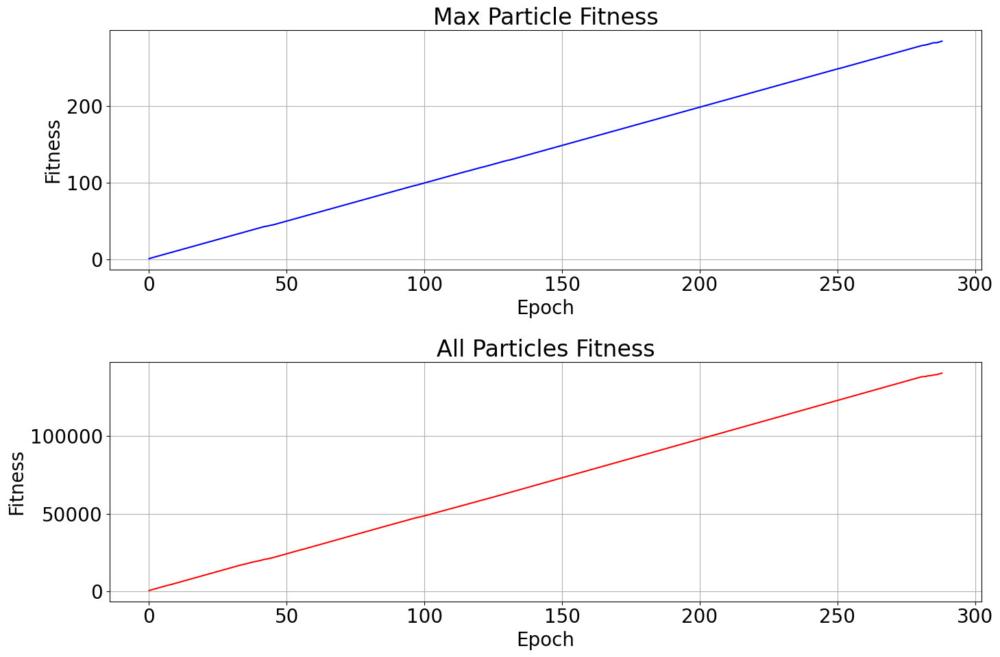

In [203]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

ax1.plot(max_particle_fitness_history, color='blue')
ax1.set_title('Max Particle Fitness')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Fitness')

ax2.plot(all_particles_fitness_history, color='red')
ax2.set_title('All Particles Fitness')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Fitness')

plt.tight_layout()
plt.show()

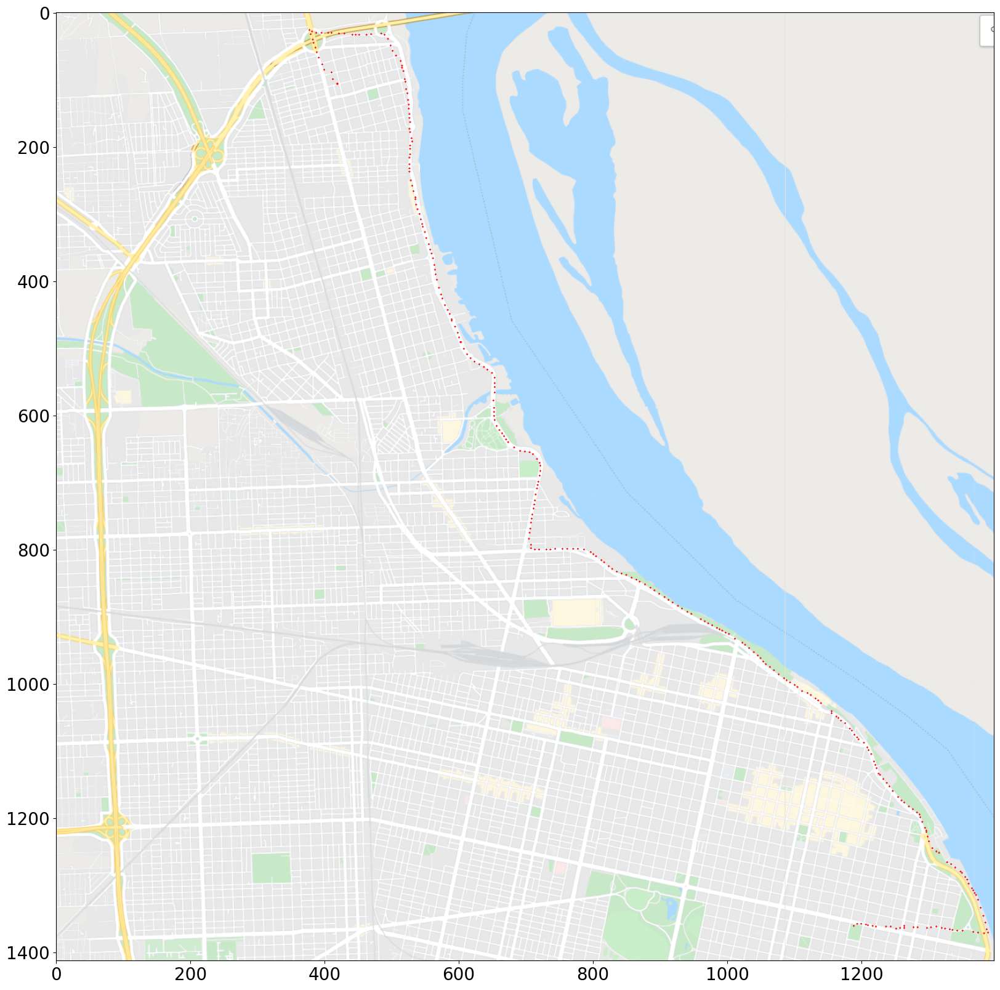

In [205]:
best_particle=np.argsort([sum(particle.fitness_history) for particle in population])[-1]
work_map.plot(population[best_particle].pos_history)